In [2]:
# packages

# JAX
import jax.ops as jop
import jax.numpy as jnp
from jax import grad, vmap
#from jax.config import config; 
import jax
jax.config.update("jax_enable_x64", True)

# Numpy
import numpy as onp
from numpy import random 

# Plot
import matplotlib.pyplot as plt
from einops import rearrange

We solve the following Burgers equation

## General equation

\begin{equation*}
\begin{aligned}
& \partial_t (\phi S_p) + \nabla \cdot (K(x) \nabla \Phi_p ) = f, x \in [-1,1], t \in [0,1]\\
& \nabla \Phi_p(x,t) = \nabla p_p - \rho_p g \\
& f(\{S_p\}_{p=\{o,w,g\}})=0 \\
& u(0,x)=-\sin(\pi x)\\
& u(t,-1)=u(t,1)=0
\end{aligned}
\end{equation*}


## 1D time derivative equation

\begin{equation*}
\begin{aligned}
& \partial_t (\phi S_p) + \partial_x (\lambda_p K_x(x) \partial_x \Phi_t) = q_p \\
& - \partial_x \lambda_t K_x(x) \partial_x \Phi_t = \int_\Omega q_t \\
& x \in [-1,1], t \in [0,1] \\
& \nabla \Phi_p(x,t) = \nabla p_p - \rho_p g \\
& S_w + S_o=1 \\
& u(0,x)=-\sin(\pi x)\\
& u(t,-1)=u(t,1)=0
\end{aligned}
\end{equation*}

## Discretization

\begin{equation*}
\begin{aligned}
& \int_\Omega \partial_t (\phi S_p) - \partial_x (\lambda_p K_x(x) \partial_x \Phi_t) = \int_\Omega q_p \\
& \int_\Omega - \partial_x \lambda_t K_x(x) \partial_x \Phi_t = \int_\Omega q_t \\
& x \in [-1,1], t \in [0,1] \\
\end{aligned}
\end{equation*}

\begin{equation*}
\begin{aligned}
\frac{\phi \Delta x}{\Delta t}((S_w)_i^{n+1}-(S_w)_i^{n}) \\
+ (\lambda_w K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{1}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \Delta x \\
- (\lambda_w K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{1}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \Delta x \\
 = q_p \Delta x \\
(\lambda_t K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \Delta x \\
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \Delta x \\
 = q_t \Delta x \\
 x \in [-1,1], t \in [0,1] \\
\end{aligned}
\end{equation*}

### Simplified

\begin{equation*}
\begin{aligned}
\phi((S_w)_i^{n+1}-(S_w)_i^{n}) \\
+ (\lambda_w K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \\
- (\lambda_w K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \\
 = q_p \\
(\lambda_t K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \\
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \\
 = q_t \\
\end{aligned}
\end{equation*}

# Fully implicit

\begin{equation*}
\begin{aligned}
R^{t+1}(S_w,p_t) = \phi((S_w)_i^{n+1}-(S_w)_i^{n}) \\
+ (\lambda_w K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \\
- (\lambda_w K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \\
 - q_p \\
R^{t+1}(S_t,p_t)=(\lambda_t K_x)_{i-\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i}^{n+1}-(p_t)_{i-1}^{n+1}) \\
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}((p_t)_{i+1}^{n+1}-(p_t)_{i}^{n+1}) \\
 - q_t \\
\end{aligned}
\end{equation*}

\begin{equation*}
\begin{aligned}
D_{thk}=(1 - kg) \frac{\Delta t^n}{h}
\end{aligned}
\end{equation*}

## Jacobian $$J_{S_w},J_{p_t},J_{S_t},J_{p_t}$$
### $J_{i,i}$
\begin{equation*}
\begin{aligned}
\partial_{S_w} R^{t+1}(S_w,p_t) = \phi \\
\partial_{p_t} R^{t+1}(S_w,p_t) = (\lambda_w K_x)_{i-\frac{1}{2}}^{n+1} \ D_{thk} + (\lambda_w K_x)_{i+\frac{1}{2}}^{n+1} \ D_{thk}\\
\partial_{S_t} R^{t+1}(S_t,p_t) = 0 \\
\partial_{p_t} R^{t+1}(S_t,p_t) = (\lambda_t K_x)_{i-\frac{1}{2}}^{n+1} \ D_{thk} + (\lambda_w K_x)_{i+\frac{1}{2}}^{n+1} \ D_{thk}
\end{aligned}
\end{equation*}

### $J_{i,i+1}$

\begin{equation*}
\begin{aligned}
\partial_{S_w} R^{t+1}(S_w,p_t) = 0 \\
\partial_{p_t} R^{t+1}(S_w,p_t)=
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x} \\
\partial_{S_t} R^{t+1}(S_t,p_t) = 0 \\
\partial_{p_t} R^{t+1}(S_t,p_t)=
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}(1)
\end{aligned}
\end{equation*}

### $J_{i,i-1}$

\begin{equation*}
\begin{aligned}
\partial_{S_w} R^{t+1}(S_w,p_t) = 0 \\
\partial_{p_t} R^{t+1}(S_w,p_w)=
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x} \\
\partial_{S_t} R^{t+1}(S_t,p_t) = 0 \\
\partial_{p_t} R^{t+1}(S_t,p_t)=
- (\lambda_t K_x)_{i+\frac{1}{2}}^{n+1} \ (1 - kg) \frac{\Delta t}{\Delta x}(1)
\end{aligned}
\end{equation*}



In [3]:
from scipy.sparse import diags
import scipy
from functools import partial
from jax import jacobian
from einops import rearrange

class FD_Darcy_flow_1D_2P(object):
    def __init__(self,N,D_BC,p_init_range=(0,0.1),nsteps=10,dt=1e-4,opt_step = 1e-4,max_iter_steps=10):
    # Create Matrix of space discrtization for solution

        self.p_init_range=p_init_range
        self.nsteps=nsteps

        L=1
        g=0.0
        self.phi=0.2
        self.mu_w = 1e-3
        self.mu_o = 1e-3
        k=1e+0

        self.N=N
        self.dt=dt
        self.x = onp.linspace(0, L, N+1)  # cell edges # N+1
        #self.x_ohm = onp.stack((self.x[:-1],self.x[1:]),axis=0)
        self.dx = L / N
        self.xc = (self.x[:-1] + self.x[1:]) * 0.5  # cell centers # N
        self.Dt=k
        self.Dw=(dt/self.dx)*k
        self.x_omh = jnp.stack((self.x[2:-1],self.x[1:-2]),axis=0)
#        self.K_c=K(self.x)
        self.Kw_bc=0.0
        self.Kt_bc=0.0
        self.D_BC=D_BC

        self.max_iter_steps=max_iter_steps
        self.opt_step = opt_step
        self.tol=1e-5

        self.t = 0

    def fw(self,x1,w_p,i_p,amp=1e-3,t=0):
      w_pot = jnp.sum(jnp.exp((-(x1-onp.expand_dims(onp.array(w_p),axis=1))**2)/amp),axis=0)**5 if len(w_p)>0 else 0
      i_pot = jnp.sum(jnp.exp((-(x1-onp.expand_dims(onp.array(i_p),axis=1))**2)/amp),axis=0)**5 if len(i_p)>0 else 0
      return (w_pot - i_pot)*(t==0)
    def ft(self,x1,w_p,i_p,amp=1e-3,t=0):
      w_pot = jnp.sum(jnp.exp((-(x1-onp.expand_dims(onp.array(w_p),axis=1))**2)/amp),axis=0)**5 if len(w_p)>0 else 0
      i_pot = jnp.sum(jnp.exp((-(x1-onp.expand_dims(onp.array(i_p),axis=1))**2)/amp),axis=0)**5 if len(i_p)>0 else 0
      return (w_pot - i_pot)*(t==0)

    @partial(jax.jit,static_argnums=(0,))
    def K(self,x):
      #return jnp.exp((0.01*jnp.sin(x*1*jnp.pi)**5)+1e-3)
      return jnp.exp((10*jnp.sin(x*10*jnp.pi)**5)+1e-3)
      #return x**2*0.01 + 5e-1

    @partial(jax.jit,static_argnums=(0,))
    def krw(self,s_w):
      sc = 9e-1
      return jnp.clip((1-sc)*(s_w**3) + sc,0,1)

    @partial(jax.jit,static_argnums=(0,))
    def kro(self,s_w):
      sc = 9e-1
      return jnp.clip((1-sc)*((1 - s_w)**3) + sc,0,1)

    @partial(jax.jit,static_argnums=(0,))
    def lambda_w(self,s_w):
      return self.krw(s_w)/self.mu_w

    @partial(jax.jit,static_argnums=(0,))
    def lambda_t(self,s_w):
      return self.krw(s_w)/self.mu_w + self.kro(s_w)/self.mu_o

    @partial(jax.jit,static_argnums=(0,))
    def R(self,u_x,u_x_omh,u_x_1,x,x_omh,D_BC,t=0): # x[n], xc [n+1], u [m,n], p_1 [m,n]
      """
      Discretized residual functions evaluated with neigborh elements
      xc: scalar value in element domain float
      x: vector of scalars for values in the adjacent elements
      u_x: vector of functions mappings from x to solution on time n
      u_1: function mapping from x to solution on time n-1
      """
      # u[0]: S_w, u[1]: p_w, u[2]: S_t, u[3]: p_t [WRONG]
      # u[0]: S_w, u[1]: p_t
      # u_x: node, u_x_omh: matrix of vecinity, u_x_1: node one step before,
      # *_omh: -x,+x,-y,+y,-z,+z
      Rw = self.phi*(u_x[0]-u_x_1[0]) \
          + self.lambda_w(u_x[0])*self.K(x_omh[0])*self.Dw*((u_x[1] - u_x_omh[1,0])) \
          - self.lambda_w(u_x[0])*self.K(x_omh[1])*self.Dw*((u_x_omh[1,1] - u_x[1])) \
          - self.fw(x,w_p=[0.5],i_p=[],t=t)*1.0
      Rt = 0 \
          + self.lambda_t(u_x[0])*self.K(x_omh[0])*self.Dt*((u_x[1] - u_x_omh[1,0])) \
          - self.lambda_t(u_x[0])*self.K(x_omh[1])*self.Dt*((u_x_omh[1,1] - u_x[1])) \
          - self.dx*self.ft(x,w_p=[],i_p=[0.75],t=t)*5.0
      return jnp.array([Rw,Rt])

    def bcR(self,u_x,u_x_omh,u_x_1,x,x_omh,D_BC,t=0): # x[n], xc [n+1], u [m,n], p_1 [m,n]
      """
      Discretized residual functions evaluated with neigborh elements
      xc: scalar value in element domain float
      x: vector of scalars for values in the adjacent elements
      u_x: vector of functions mappings from x to solution on time n
      u_1: function mapping from x to solution on time n-1
      """
      # u[0]: S_w, u[1]: p_w, u[2]: S_t, u[3]: p_t [WRONG]
      # u[0]: S_w, u[1]: p_t
      # u_x: node, u_x_omh: matrix of vecinity, u_x_1: node one step before,
      # *_omh: -x,+x,-y,+y,-z,+z
      Rw = self.phi*(u_x[0]-u_x_1[0]) \
          + self.lambda_w(u_x[0])*self.K(x_omh[0])*self.Dw*((u_x[1] - u_x_omh[1,0])*D_BC) + self.Kw_bc*(1-D_BC) \
          - self.lambda_w(u_x[0])*self.K(x_omh[1])*self.Dw*((u_x_omh[1,1] - u_x[1])*D_BC) + self.Kw_bc*(1-D_BC) \
          - self.dt*self.fw(x,w_p=[0.5],i_p=[],t=t)*1.0
      Rt = 0 \
          + self.lambda_t(u_x[0])*self.K(x_omh[0])*self.Dt*((u_x[1] - u_x_omh[1,0])*D_BC) + self.Kt_bc*(1-D_BC) \
          - self.lambda_t(u_x[0])*self.K(x_omh[1])*self.Dt*((u_x_omh[1,1] - u_x[1])*D_BC) + self.Kt_bc*(1-D_BC) \
          - self.dx*self.ft(x,w_p=[],i_p=[0.75],t=t)*5.0
      return jnp.array([Rw,Rt])

    def build_jacobian_ii(self):
      """
      ([Num residuals], [Num Elements], [Mapping from domain to field])
      """
      #self.J_R_ii=jacobian(self.R,0)
      self.J_R_i_i = vmap(jacobian(self.R,0),in_axes=(-1,-1,-1,-1,-1,-1))

    def build_jacobian_ij(self):
      """
      ([Num residuals], [Num Elements], [Num Mapping from domain to field], [Num vecinity elements])
      """
      #self.J_R_i_ohm=jacobian(self.R,1)
      self.J_R_i_ohm = vmap(jacobian(self.R,1),in_axes=(-1,-1,-1,-1,-1,-1))

    def build_matrix(self,u_x,u_x_omh,u_x_1,x,x_omh,D_BC):
      """
      For the specific case of this residual shapes are
      R_ii ([Num elements],[Num residual],[1],[Num mappings])(98, 2, 1, 2)
      R_ij ([Num elements],[Num residual],[1],[Num mappings],[Num neigh])(98, 2, 1, 2, 2)
      """
      args = (u_x,u_x_omh,u_x_1,x,x_omh,D_BC)

      J_R_ii_X = self.J_R_i_i(*args)
      J_R_ij_X = self.J_R_i_ohm(*args)
      J_R_ii_X =  rearrange(J_R_ii_X,"e r 1 m -> e m r")
      J_R_ij_X =  rearrange(J_R_ij_X,"e r 1 m v-> v e m r")
      pre_A = jnp.zeros((J_R_ii_X.shape[0],J_R_ii_X.shape[0],J_R_ii_X.shape[1],J_R_ii_X.shape[2])) # [e e m r]
      e_idx=jnp.arange(J_R_ii_X.shape[0])
      # Center
      pre_A=pre_A.at[e_idx,e_idx].set(J_R_ii_X[e_idx])
      # *_omh: -x,+x,-y,+y,-z,+z
      # Left
      pre_A=pre_A.at[e_idx[:-1],e_idx[:-1]+1].set(J_R_ij_X[1][e_idx[:-1]])
      # Right
      pre_A=pre_A.at[e_idx[:-1]+1,e_idx[:-1]].set(J_R_ij_X[0][e_idx[1:]])

      A = rearrange(pre_A,"ei ej m r -> (ei r) (ej m)")
      return A

    def cg_step(self,u_x,u_x_1,x,t): # u_x [m e] x [e]

      u_x_omh = jnp.stack((
          onp.concatenate((onp.zeros((u_x.shape[0],1)),u_x[:,:-1]),axis=1),
          onp.concatenate((u_x[:,1:],onp.zeros((u_x.shape[0],1))),axis=1)
          ),-2) # u[m e] -> u_omh[m v e] # Stack the additional flag
      x_omh = jnp.stack((self.x[1:],self.x[:-1]),0) # x[e] -> x[e v]

      A = self.build_matrix(u_x,u_x_omh,u_x_1,x,x_omh,self.D_BC)
      R = self.bcR(u_x,u_x_omh,u_x_1,x,x_omh,self.D_BC,t=t)[:,onp.newaxis]
      R = rearrange(R,"e 1 r -> (e r) 1")
      conv_mearsure = onp.mean((R)**2)
      dU = scipy.sparse.linalg.spsolve(A, -1*R)
      dU = rearrange(dU," (e m)-> m e",e=u_x.shape[1],m=u_x.shape[0])
      new_u_x = u_x + self.opt_step * dU
      new_u_x[0,:]=jnp.clip(new_u_x[0,:],0.0,1.0)
      return new_u_x,dU

    def cg_iter(self,u_x,u_x_1,x,t): # u_x [m e] x [e]
        for i in range(self.max_iter_steps):
            new_p,dU = self.cg_step(u_x,u_x_1,x,t)
            new_p[0,:]=onp.clip(new_p[0,:],0.0,1.0)
            conv_mearsure = onp.mean((dU)**2)
            u_x=new_p
            if conv_mearsure< self.tol:
                return new_p
        return new_p

    def time_step(self,u_x,u_x_1):
      # is determinable
      u_x = self.cg_iter(u_x,u_x_1,self.xc,self.t)
      self.t = self.t + self.dt
      return u_x


In [4]:
D_BC = onp.ones(100)
D_BC[0]=1
D_BC[-1]=1
M=FD_Darcy_flow_1D_2P(N=100,D_BC=D_BC,p_init_range=(0,0.1),nsteps=10,dt=1e-2,opt_step=1e-3,max_iter_steps=100)
#M=FD_Darcy_flow_1D_2P(N=1000,D_BC=D_BC,p_init_range=(0,0.1),nsteps=10,dt=1e-3,opt_step=1e-3,max_iter_steps=100)

M.build_jacobian_ii()
M.build_jacobian_ij()
u_x=onp.ones((2,) + M.xc.shape) * onp.array([[0.3,0.0]]).T

u_x_1=onp.ones((2,) + M.xc.shape) * onp.array([[0.3,0.0]]).T

U=[u_x_1]

for i in range(150):
  print(f"step {i}")
  u_new = M.time_step(u_x,u_x_1)
  U.append(u_new)
  u_x = u_new.copy()
  u_x_1 = u_new.copy()

step 0


/tmp/ipykernel_2194396/2367146969.py:170: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  dU = scipy.sparse.linalg.spsolve(A, -1*R)


step 1
step 2
step 3
step 4
step 5
step 6
step 7
step 8
step 9
step 10
step 11
step 12
step 13
step 14
step 15
step 16
step 17
step 18
step 19
step 20
step 21
step 22
step 23
step 24
step 25
step 26
step 27
step 28
step 29
step 30
step 31
step 32
step 33
step 34
step 35
step 36
step 37
step 38
step 39
step 40
step 41
step 42
step 43
step 44
step 45
step 46
step 47
step 48
step 49
step 50
step 51
step 52
step 53
step 54
step 55
step 56
step 57
step 58
step 59
step 60
step 61
step 62
step 63
step 64
step 65
step 66
step 67
step 68
step 69
step 70
step 71
step 72
step 73
step 74
step 75
step 76
step 77
step 78
step 79
step 80
step 81
step 82
step 83
step 84
step 85
step 86
step 87
step 88
step 89
step 90
step 91
step 92
step 93
step 94
step 95
step 96
step 97
step 98
step 99
step 100
step 101
step 102
step 103
step 104
step 105
step 106
step 107
step 108
step 109
step 110
step 111
step 112
step 113
step 114
step 115
step 116
step 117
step 118
step 119
step 120
step 121
step 122
step 123
s

KeyboardInterrupt: 

In [5]:
U = rearrange(onp.array(U),"t u x-> u t x")

/tmp/ipykernel_2194396/3631118899.py:13: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax2.set_ylim(U[1,0].min(), U[1,0].max())


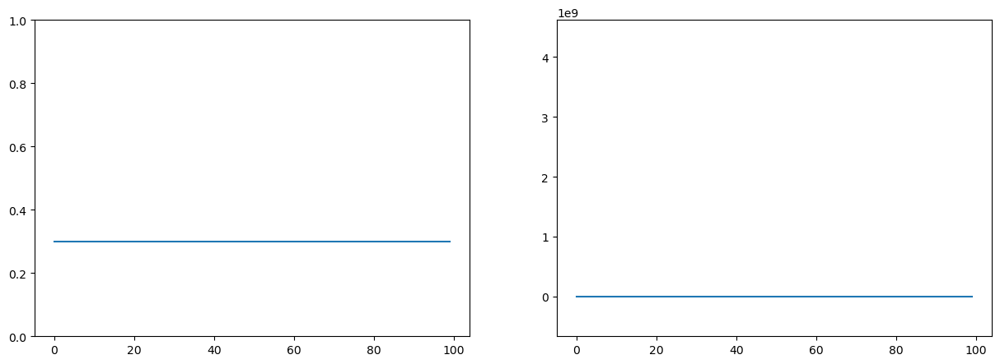

In [10]:
#%matplotlib inline
from IPython.display import HTML

import matplotlib.animation as animation
fig = plt.figure(figsize=(15,5))
fig.tight_layout()

# plot the collocation pts
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
l1, = ax1.plot(U[0,0])
l2, = ax2.plot(U[1,0])
ax2.set_ylim(U[1,0].min(), U[1,0].max())
def animate(i):
    #l.plot(h_p[i],)
    l1.set_ydata(U[0,i])
    l2.set_ydata(U[1,i])
    ax1.set_ylim(0, 1)
    ax2.set_ylim(U[1].min(), U[1].max())
    return l1,l2

ani = animation.FuncAnimation(fig, animate, frames=len(U[0]),interval=50)


#HTML(ani.to_jshtml())
#HTML(ani.to_html5_video())
HTML(ani.to_jshtml())


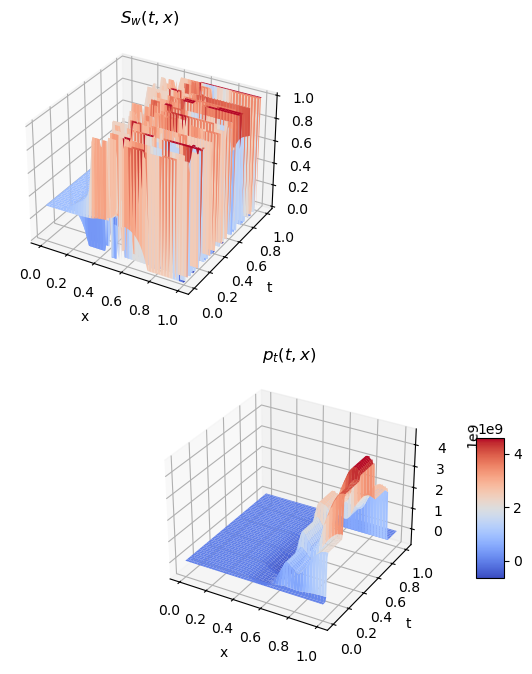

In [18]:
# plot the solution u(x,y), at the space-time domain or at a single time
    
def plot_u(num_pts1, num_pts2):
    xx = onp.linspace(0, 1, num_pts1)
    yy = onp.linspace(0, 1, num_pts2)
    XX, YY = onp.meshgrid(xx, yy)

    # vectorized (x,y) coordinates
    XXv = onp.array(XX.flatten())
    YYv = onp.array(YY.flatten())

    ZZ_u = U # [u t x]
    
    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(211, projection='3d')
    u_surf=ax.plot_surface(YY, XX, ZZ_u[0], cmap=plt.cm.coolwarm)
    plt.xlabel('x')
    plt.ylabel('t')
    plt.title('$S_w(t,x)$')

    ax = fig.add_subplot(212, projection='3d')
    u_surf=ax.plot_surface(YY, XX, ZZ_u[1], cmap=plt.cm.coolwarm)
    plt.xlabel('x')
    plt.ylabel('t')
    plt.title('$p_t(t,x)$')
    
    fig.colorbar(u_surf, shrink= 0.5, aspect = 5)
    plt.show()
    
def plot_u_time_t(t, num_pts):
    xx = t
    yy = onp.linspace(-1, 1, num_pts)
    XX, YY = onp.meshgrid(xx, yy)

    # vectorized (x,y) coordinates
    XXv = onp.array(XX.flatten())
    YYv = onp.array(YY.flatten())

    ZZ_u = vmap(u_true)(XXv, YYv)
    
    fig = plt.figure(figsize=(12,8))
    plt.plot(yy, ZZ_u)
    plt.xlabel('x')
    plt.title('u(t,x) at time %f' %t)
    plt.show()
    
# test
# plot the figure
plot_u(100,141)

In [20]:
U.shape

(2, 141, 100)

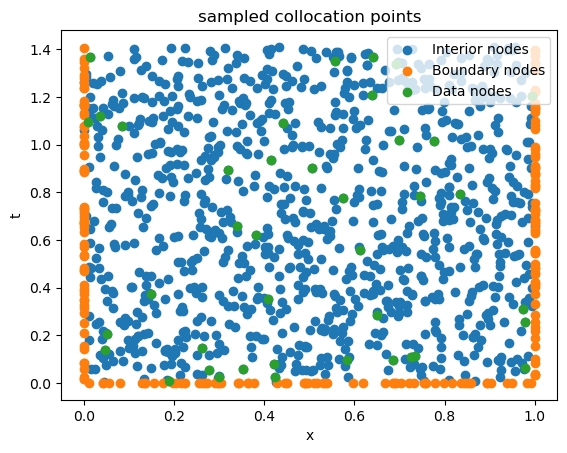

In [28]:
# sampled collocation points

def sample_points(N_domain, N_boundary, N_data):
    # interior nodes
    x_min = 0
    x_max = 1
    t_min = 0
    t_max = U.shape[1]*1e-2
    X_domain = onp.random.uniform(0, 1, (N_domain, 2))
    X_domain[:,0] = (t_min + X_domain[:,0])*t_max
    X_domain[:,1] = (x_min + X_domain[:,1])*x_max
    X_boundary = onp.zeros((N_boundary, 2))

    # interior nodes
    #X_domain = random.uniform(0, 1.0, (N_domain, 2))
    #X_domain[:,1] = 2*X_domain[:,1]-1
    #X_boundary = onp.zeros((N_boundary, 2))

    # generate random boundary points on the faces of the domain 

    # bottom face
    X_boundary[:int(N_boundary/3), 1] = random.uniform(x_min, x_max, int(N_boundary/3))
    # right face
    X_boundary[int(N_boundary/3):2*int(N_boundary/3), 0] = random.uniform(t_min, t_max, int(N_boundary/3))
    X_boundary[int(N_boundary/3):2*int(N_boundary/3), 1] = x_max
    # left face
    X_boundary[2*int(N_boundary/3):, 0] = random.uniform(t_min, t_max, int(N_boundary/3))
    X_boundary[2*int(N_boundary/3):, 1] = x_min
    data_index = onp.array(range(N_data))
    
    return X_domain, X_boundary, data_index

N_domain_tot = 1000
N_boundary_tot = 201
N_data_tot = 40

X_domain_tot, X_boundary_tot, data_index_tot = sample_points(N_domain_tot, N_boundary_tot, N_data_tot)

fig, ax = plt.subplots()
ax.scatter(X_domain_tot[range(N_domain_tot), 1], X_domain_tot[range(N_domain_tot), 0], label='Interior nodes')
ax.scatter(X_boundary_tot[range(N_boundary_tot), 1], X_boundary_tot[range(N_boundary_tot), 0], label='Boundary nodes')
ax.scatter(X_domain_tot[data_index_tot, 1], X_domain_tot[data_index_tot, 0], label='Data nodes')
ax.legend(loc="upper right")
ax.set_xlabel('x')
ax.set_ylabel('t')
plt.title('sampled collocation points')
plt.show()

Now, let us define kernels / covariance functions that are used to solve the PDEs

We use kernels for both time and space as:
$$k(x,y) = \exp(-\alpha_1^2(x_1-y_1)^2-\alpha_2^2(x_2-y_2)^2)$$

where:
$\alpha_1$: scale parameter in time

$\alpha_2$: scale parameter in space


In [7]:
# kernels and derivatives

def kappa(x1, x2, y1, y2, sigma):
    # x,y are 2D input row vectors
    
    scale_t = sigma[0]
    scale_x = sigma[1]
    
    r = (scale_t*(x1-y1))**2+(scale_x*(x2-y2))**2

    return jnp.exp(-r)


def D_x1_kappa(x1, x2, y1, y2, sigma):
    val = grad(kappa,0)(x1, x2, y1, y2, sigma)
    return val

def D_x2_kappa(x1, x2, y1, y2, sigma):
    val = grad(kappa,1)(x1, x2, y1, y2, sigma)
    return val

def DD_x2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(kappa,1),1)(x1, x2, y1, y2, sigma)
    return val

def D_y1_kappa(x1, x2, y1, y2, sigma):
    val = grad(kappa,2)(x1, x2, y1, y2, sigma)
    return val

def D_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(kappa,3)(x1, x2, y1, y2, sigma)
    return val

def DD_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(kappa,3),3)(x1, x2, y1, y2, sigma)
    return val

def D_x1_D_y1_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(kappa,0),2)(x1, x2, y1, y2, sigma)
    return val

def D_x1_D_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(kappa,0),3)(x1, x2, y1, y2, sigma)
    return val

def D_x1_DD_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(grad(kappa,0),3),3)(x1, x2, y1, y2, sigma)
    return val

def D_x2_D_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(kappa,1),3)(x1, x2, y1, y2, sigma)
    return val

def D_x2_DD_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(grad(kappa,1),3),3)(x1, x2, y1, y2, sigma)
    return val

def DD_x2_DD_y2_kappa(x1, x2, y1, y2, sigma):
    val = grad(grad(grad(grad(kappa,1),1),3),3)(x1, x2, y1, y2, sigma)
    return val


Now, we will construct the Gram matrix, based on the observation $u(x_i), u_t(x_i), u_x(x_i), u_{xx}(x_i)$

We organize all the variables in the way: $[v_1,v_2,v_3,v_0,v_b]$, where $v_0, v_1, v_2, v_3$ represent the interior nodal values of $u(x_i), u_t(x_i), u_x(x_i), u_{xx}(x_i)$, respectively; and $v_b$ is the boundary value. 

The Gram matrix $\Theta$ is then determined by this organization. Next code block is to construct this matrix.


In [8]:
onp.tile(onp.array([0,1]),(3,1))

array([[0, 1],
       [0, 1],
       [0, 1]])

In [9]:
# vectorized construction of the Gram matrix Theta
def assembly_Theta(X_domain, X_boundary, nugget, set_sigma):
    
    N_domain = X_domain.shape[0]
    N_boundary = X_boundary.shape[0]
    Theta = jnp.zeros((4*N_domain + N_boundary, 4*N_domain + N_boundary))

    # auxiliary variables to make things readable
    # interior points coordinates
    Xd0=X_domain[:N_domain, 0]
    Xd1=X_domain[:N_domain, 1]
    
    # interior + boundary points coordinates
    Xdb0=jnp.concatenate([Xd0, X_boundary[:N_boundary, 0]])
    print("interior + boundary points coordinates")
    print(Xdb0.shape)
    Xdb1=jnp.concatenate([Xd1, X_boundary[:N_boundary, 1]])

    # interior v.s. interior interaction (used for construct kernel matrix)
    XXdd0=jnp.transpose(jnp.tile(Xd0,(N_domain,1)))
    print("interior v.s. interior interaction (used for construct kernel matrix)")
    print(XXdd0.shape)
    XXdd1=jnp.transpose(jnp.tile(Xd1,(N_domain,1)))

    # interior+boudary v.s. interior+bpundary interaction
    XXdbdb0=jnp.transpose(jnp.tile(Xdb0,(N_domain+N_boundary,1)))
    XXdbdb1=jnp.transpose(jnp.tile(Xdb1,(N_domain+N_boundary,1)))

    # interior v.s. interior+boundary interaction
    XXddb0=jnp.transpose(jnp.tile(Xd0,(N_domain+N_boundary,1)))
    XXddb1=jnp.transpose(jnp.tile(Xd1,(N_domain+N_boundary,1)))
    XXddb0_2=jnp.tile(Xdb0,(N_domain,1))
    XXddb1_2=jnp.tile(Xdb1,(N_domain,1))

    # Construct kernel matrix
    # interior v.s. interior 
    val = vmap(lambda x1, x2, y1, y2: D_x1_D_y1_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[0:N_domain, 0:N_domain], jnp.reshape(val, (N_domain, N_domain)))
    
    val = vmap(lambda x1, x2, y1, y2: D_x1_D_y2_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[0:N_domain, N_domain:2*N_domain], jnp.reshape(val, (N_domain, N_domain)))
    Theta = jop.index_update(Theta, jop.index[N_domain:2*N_domain, 0:N_domain], jnp.transpose(jnp.reshape(val, (N_domain, N_domain))))
    
    val = vmap(lambda x1, x2, y1, y2: D_x1_DD_y2_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[0:N_domain, 2*N_domain:3*N_domain], jnp.reshape(val, (N_domain, N_domain)))
    Theta = jop.index_update(Theta, jop.index[2*N_domain:3*N_domain, 0:N_domain], jnp.transpose(jnp.reshape(val, (N_domain, N_domain))))
    
    val = vmap(lambda x1, x2, y1, y2: D_x2_D_y2_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[N_domain:2*N_domain, N_domain:2*N_domain], jnp.reshape(val, (N_domain, N_domain)))
    
    val = vmap(lambda x1, x2, y1, y2: D_x2_DD_y2_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[N_domain:2*N_domain, 2*N_domain:3*N_domain], jnp.reshape(val, (N_domain, N_domain)))
    Theta = jop.index_update(Theta, jop.index[2*N_domain:3*N_domain, N_domain:2*N_domain], jnp.transpose(jnp.reshape(val, (N_domain, N_domain))))
    
    val = vmap(lambda x1, x2, y1, y2: DD_x2_DD_y2_kappa(x1, x2, y1, y2, set_sigma))(
        XXdd0.flatten(),XXdd1.flatten(),jnp.transpose(XXdd0).flatten(),jnp.transpose(XXdd1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[2*N_domain:3*N_domain, 2*N_domain:3*N_domain], jnp.reshape(val, (N_domain, N_domain)))
    
    # interior+boundary v.s. interior+boundary
    val = vmap(lambda x1, x2, y1, y2: kappa(x1, x2, y1, y2, set_sigma))(
        XXdbdb0.flatten(),XXdbdb1.flatten(),jnp.transpose(XXdbdb0).flatten(),jnp.transpose(XXdbdb1).flatten()
    )
    Theta = jop.index_update(Theta, jop.index[3*N_domain:, 3*N_domain:], jnp.reshape(val, (N_domain+N_boundary, N_domain+N_boundary)))
    
    # interior v.s. interior+boundary
    val = vmap(lambda x1, x2, y1, y2: D_x1_kappa(x1, x2, y1, y2, set_sigma))(
        XXddb0.flatten(),XXddb1.flatten(),XXddb0_2.flatten(),XXddb1_2.flatten()
    )
    Theta = jop.index_update(Theta, jop.index[0:N_domain, 3*N_domain:], jnp.reshape(val, (N_domain, N_domain+N_boundary)))
    Theta = jop.index_update(Theta, jop.index[3*N_domain:, 0:N_domain], jnp.transpose(jnp.reshape(val, (N_domain, N_domain+N_boundary))))
    
    val = vmap(lambda x1, x2, y1, y2: D_x2_kappa(x1, x2, y1, y2, set_sigma))(
        XXddb0.flatten(),XXddb1.flatten(),XXddb0_2.flatten(),XXddb1_2.flatten()
    )
    Theta = jop.index_update(Theta, jop.index[N_domain:2*N_domain, 3*N_domain:], jnp.reshape(val, (N_domain, N_domain+N_boundary)))
    Theta = jop.index_update(Theta, jop.index[3*N_domain:, N_domain:2*N_domain], jnp.transpose(onp.reshape(val, (N_domain, N_domain+N_boundary))))
    
    val = vmap(lambda x1, x2, y1, y2: DD_x2_kappa(x1, x2, y1, y2, set_sigma))(
        XXddb0.flatten(),XXddb1.flatten(),XXddb0_2.flatten(),XXddb1_2.flatten()
        )
    Theta = jop.index_update(Theta, jop.index[2*N_domain:3*N_domain, 3*N_domain:], jnp.reshape(val, (N_domain, N_domain+N_boundary)))
    Theta = jop.index_update(Theta, jop.index[3*N_domain:, 2*N_domain:3*N_domain], jnp.transpose(jnp.reshape(val, (N_domain, N_domain+N_boundary))))
    
    # calculate trace
    trace1 = jnp.trace(Theta[:N_domain, :N_domain])
    trace2 = jnp.trace(Theta[N_domain:2*N_domain, N_domain:2*N_domain])
    trace3 = jnp.trace(Theta[2*N_domain:3*N_domain, 2*N_domain:3*N_domain])
    trace4 = jnp.trace(Theta[3*N_domain:, 3*N_domain:])
    ratio = [trace1/trace4, trace2/trace4, trace3/trace4]
    
    temp=jnp.concatenate((ratio[0]*jnp.ones((1,N_domain)), ratio[1]*jnp.ones((1,N_domain)), ratio[2]*jnp.ones((1,N_domain)), jnp.ones((1,N_domain+N_boundary))), axis=1)
    Theta = Theta + nugget*jnp.diag(temp[0]) 
    L = jnp.linalg.cholesky(Theta)
    
    return L


In the above, we added trace-adaptive nugget terms to regularize the Gram matrix
\begin{equation*}
\Theta_{\lambda} = \Theta +
\text{nugget}\times\begin{bmatrix}
\lambda_1 I & 0 & 0 & 0\\
0 & \lambda_2 I & 0 & 0\\
0 & 0 & \lambda_3I & 0 \\
0 & 0 & 0 & I
\end{bmatrix}
\end{equation*}
where $\lambda_1, \lambda_2, \lambda_3$ are selected to be the trace ratios of the orginal Gram matrix

Then, we solve the following optimization problem:
\begin{equation*}
\begin{aligned}
\min&\quad   [v_1,v_2,v_3,v_0,v_b]\Theta_{\lambda}^{-1} [v_1,v_2,v_3,v_0,v_b]^T\\
  \text{s.t.}&\quad v_1+\alpha v_0v_2-\nu v_3=f, \text{ and } v_b = \text{boundary data}
\end{aligned}
\end{equation*}

Here, $v_0, v_1, v_2, v_3$ represent the interior nodal values of $u(x_i), u_t(x_i), u_x(x_i), u_{xx}(x_i)$, respectively.

In [10]:
# loss functions
def J(v,rhs_f,bdy_g,L):
    N_domain = rhs_f.shape[0]
    v0 = v[:N_domain]
    v2 = v[N_domain:2*N_domain]
    v3 = v[2*N_domain:]
    
    vv = jnp.append(nu*v3+rhs_f-alpha*v0*v2, v2)
    vv = jnp.append(vv, v3)
    vv = jnp.append(vv, v0)
    vv = jnp.append(vv, bdy_g)
    temp = jnp.linalg.solve(L,vv)
    return jnp.dot(temp, temp)

# gradient of loss functions
grad_J = grad(J)

# Hessian in the Gaussian Newton method
def Hessian_GN(v,rhs_f,bdy_g,L):
    N_domain = rhs_f.shape[0]
    N_boundary = bdy_g.shape[0]
    v0 = v[:N_domain]
    v2 = v[N_domain:2*N_domain]
    v3 = v[2*N_domain:]

    mtx = jnp.zeros((4*N_domain+N_boundary, 3*N_domain))
    mtx1 = jnp.concatenate((-alpha*jnp.diag(v2), -alpha*jnp.diag(v0), nu*jnp.eye(N_domain)), axis=1)
    mtx = jop.index_update(mtx, jop.index[0:N_domain, :], mtx1)
    mtx = jop.index_update(mtx, jop.index[N_domain:2*N_domain, N_domain:2*N_domain], jnp.eye(N_domain))
    mtx = jop.index_update(mtx, jop.index[2*N_domain:3*N_domain, 2*N_domain:3*N_domain], jnp.eye(N_domain))
    mtx = jop.index_update(mtx, jop.index[3*N_domain:4*N_domain, :N_domain], jnp.eye(N_domain))
    ss = jnp.linalg.solve(L, mtx)
    return 2*jnp.matmul(jnp.transpose(ss),ss)

# solve PDEs
def pde_solver(X_domain, X_boundary, nugget, max_iter, initial_sol, set_sigma, output_history = 0):
    N_domain = X_domain.shape[0]
    
    rhs_f = vmap(f)(X_domain[:,0], X_domain[:,1])  # rhs data
    bdy_g = vmap(u)(X_boundary[:,0], X_boundary[:,1]) # boundary data
    
    # define cost function
    L = assembly_Theta(X_domain, X_boundary, nugget, set_sigma)
    sol = initial_sol
    step_size = 1
    
    J_hist = [] # history of loss function values
    J_now = J(sol,rhs_f,bdy_g,L)
    J_hist.append(J_now)
    
    for iter_step in range(max_iter):
        temp = jnp.linalg.solve(Hessian_GN(sol,rhs_f,bdy_g,L), grad_J(sol,rhs_f,bdy_g,L))
        sol = sol - step_size*temp
        
        # iteration history
        if output_history == 1:
            J_now = J(sol,rhs_f,bdy_g,L)
            J_hist.append(J_now)
            print('iter = ', iter_step, 'Gauss-Newton step size =', step_size, ' J = ', J_now)
    J_now = J(sol,rhs_f,bdy_g,L)
    return sol, J_hist, J_now, L




In [11]:
# ----- test pde solution

nugget=1e-5
max_iter=12
initial_sol=random.normal(0, 1.0, (3*N_domain_tot))
set_sigma=jnp.array([3,20])
print('parameter sigma is set to be ', set_sigma)
sol, J_hist, J_final, L = pde_solver(X_domain_tot, X_boundary_tot, nugget, max_iter, initial_sol, set_sigma, 1)



parameter sigma is set to be  [ 3 20]
interior + boundary points coordinates
(1201,)
interior v.s. interior interaction (used for construct kernel matrix)
(1000, 1000)


AttributeError: module 'jax.ops' has no attribute 'index_update'

In [10]:
# extend solution to the whole domain: functions

def construct_inpTheta(X_test, X_domain, X_boundary):
    N_domain = X_domain.shape[0]
    N_boundary = X_boundary.shape[0]
    N_test = X_test.shape[0]
    inpTheta = onp.zeros((N_test, 4*N_domain + N_boundary))

    # auxiliary variables to make things readable
    
    # X_left coordinates
    Xt0=X_test[:,0]
    Xt1=X_test[:,1]
    
    # interior points coordinates
    Xd0=X_domain[:N_domain, 0]
    Xd1=X_domain[:N_domain, 1]
    
    # interior + boundary points coordinates
    Xdb0=onp.concatenate([Xd0, X_boundary[:N_boundary, 0]])
    Xdb1=onp.concatenate([Xd1, X_boundary[:N_boundary, 1]])
    
    # left v.s. interior
    XXtd0=onp.transpose(onp.tile(Xt0,(N_domain,1)))
    XXtd1=onp.transpose(onp.tile(Xt1,(N_domain,1)))
    XXtd0_2=onp.tile(Xd0,(N_test,1))
    XXtd1_2=onp.tile(Xd1,(N_test,1))
    
    # left v.s. interior + boundary
    XXtdb0=onp.transpose(onp.tile(Xt0,(N_domain+N_boundary,1)))
    XXtdb1=onp.transpose(onp.tile(Xt1,(N_domain+N_boundary,1)))
    XXtdb0_2=onp.tile(Xdb0,(N_test,1))
    XXtdb1_2=onp.tile(Xdb1,(N_test,1))
    
    # constructing Theta matrix
    val = vmap(lambda x1, x2, y1, y2: D_y1_kappa(x1, x2, y1, y2, set_sigma))(XXtd0.flatten(),XXtd1.flatten(),XXtd0_2.flatten(),XXtd1_2.flatten())
    inpTheta[:,:N_domain] = onp.reshape(val, (N_test, N_domain))
    
    val = vmap(lambda x1, x2, y1, y2: D_y2_kappa(x1, x2, y1, y2, set_sigma))(XXtd0.flatten(),XXtd1.flatten(),XXtd0_2.flatten(),XXtd1_2.flatten())
    inpTheta[:,N_domain:2*N_domain] = onp.reshape(val, (N_test, N_domain))
    
    val = vmap(lambda x1, x2, y1, y2: DD_y2_kappa(x1, x2, y1, y2, set_sigma))(XXtd0.flatten(),XXtd1.flatten(),XXtd0_2.flatten(),XXtd1_2.flatten())
    inpTheta[:,2*N_domain:3*N_domain] = onp.reshape(val, (N_test, N_domain))
    
    val = vmap(lambda x1, x2, y1, y2: kappa(x1, x2, y1, y2, set_sigma))(XXtdb0.flatten(),XXtdb1.flatten(),XXtdb0_2.flatten(),XXtdb1_2.flatten())
    inpTheta[:,3*N_domain:4*N_domain+N_boundary] = onp.reshape(val, (N_test, N_domain+N_boundary))

    return inpTheta


def extend_solution(X_test, L, v):
        
    inp_Theta = construct_inpTheta(X_test, X_domain_tot, X_boundary_tot)
    
    aux = jnp.linalg.solve(jnp.transpose(L),jnp.linalg.solve(L,v))
    
    extended_u = onp.matmul(inp_Theta,aux)
    return extended_u


def sol_time_t(t, num_pts, sol, L):
    xx=t
    yy = onp.linspace(-1, 1, num_pts)
    XX, YY = onp.meshgrid(xx, yy)

    # vectorized (x,y) coordinates
    XXv = onp.array(XX.flatten())
    YYv = onp.array(YY.flatten())
    XXv=onp.expand_dims(XXv, axis=1) 
    YYv=onp.expand_dims(YYv, axis=1) 

    X_test=jnp.concatenate((XXv,YYv), axis=1)
    
    rhs_f = vmap(f)(X_domain_tot[:,0], X_domain_tot[:,1])  
    bdy_g = vmap(u)(X_boundary_tot[:,0], X_boundary_tot[:,1])
    v0 = sol[:N_domain_tot]
    v2 = sol[N_domain_tot:2*N_domain_tot]
    v3 = sol[2*N_domain_tot:]
    vv = jnp.concatenate((nu*v3+rhs_f-alpha*v0*v2, v2, v3, v0, bdy_g), axis=0)
    
    extended_u = extend_solution(X_test, L, vv)
    u_truth=vmap(u_true)(XXv, YYv)
    u_truth=u_truth.flatten()
    
    # L2err
    L2err = onp.sqrt(onp.sum((extended_u-u_truth)**2)/(num_pts))
    # Maxerr
    Maxerr = onp.max(abs(extended_u-u_truth))
    
    return yy, extended_u, u_truth, L2err, Maxerr

def sol_time_space(num_pts_time, num_pts_space, sol, L):
    xx= onp.linspace(0, 1, num_pts_time)
    yy = onp.linspace(-1, 1, num_pts_space)
    XX, YY = onp.meshgrid(xx, yy)

    # vectorized (x,y) coordinates
    XXv = onp.array(XX.flatten())
    YYv = onp.array(YY.flatten())
    XXv=onp.expand_dims(XXv, axis=1) 
    YYv=onp.expand_dims(YYv, axis=1) 

    X_test=jnp.concatenate((XXv,YYv), axis=1)
    
    rhs_f = vmap(f)(X_domain_tot[:,0], X_domain_tot[:,1])  
    bdy_g = vmap(u)(X_boundary_tot[:,0], X_boundary_tot[:,1])
    v0 = sol[:N_domain_tot]
    v2 = sol[N_domain_tot:2*N_domain_tot]
    v3 = sol[2*N_domain_tot:]
    vv = jnp.concatenate((nu*v3+rhs_f-alpha*v0*v2, v2, v3, v0, bdy_g), axis=0)
    
    extended_u = extend_solution(X_test, L, vv)
    extended_u = extended_u.reshape(num_pts_space, num_pts_time)
    
    u_truth = onp.vectorize(u_true)(XXv, YYv)
    u_truth = u_truth.reshape(num_pts_space, num_pts_time)
    
    # L2err
    L2err = onp.linalg.norm(extended_u-u_truth,'fro')/(onp.sqrt(num_pts_space*num_pts_time))
    
    # Maxerr
    Maxerr = onp.max(abs(extended_u-u_truth))
    
    return XX, YY, extended_u, u_truth, L2err, Maxerr




In [19]:
import numpy as onp
import jax.numpy as jnp
xx = onp.linspace(0,1,5)
yy = onp.linspace(-1,1,5)
XX,YY = onp.meshgrid(xx,yy)
XXv = onp.expand_dims(XX.flatten(),axis=1)
jnp.concatenate((XXv,XXv),axis=1)


Array([[0.  , 0.  ],
       [0.25, 0.25],
       [0.5 , 0.5 ],
       [0.75, 0.75],
       [1.  , 1.  ],
       [0.  , 0.  ],
       [0.25, 0.25],
       [0.5 , 0.5 ],
       [0.75, 0.75],
       [1.  , 1.  ],
       [0.  , 0.  ],
       [0.25, 0.25],
       [0.5 , 0.5 ],
       [0.75, 0.75],
       [1.  , 1.  ],
       [0.  , 0.  ],
       [0.25, 0.25],
       [0.5 , 0.5 ],
       [0.75, 0.75],
       [1.  , 1.  ],
       [0.  , 0.  ],
       [0.25, 0.25],
       [0.5 , 0.5 ],
       [0.75, 0.75],
       [1.  , 1.  ]], dtype=float64)

In [11]:
# extend solution: data calculation

num_pts_time = 30
num_pts_space = 100
XX, YY, extended_u, u_truth, space_time_L2err, space_time_Maxerr = sol_time_space(num_pts_time, num_pts_space, sol, L)

t = 0.2
yy, extended_u_t1, u_truth_t1, L2err_t1, Maxerr_t1 = sol_time_t(t, num_pts_space, sol, L)

t = 0.5
yy, extended_u_t2, u_truth_t2, L2err_t2, Maxerr_t2 = sol_time_t(t, num_pts_space, sol, L)

t = 0.8
yy, extended_u_t3, u_truth_t3, L2err_t3, Maxerr_t3 = sol_time_t(t, num_pts_space, sol, L)



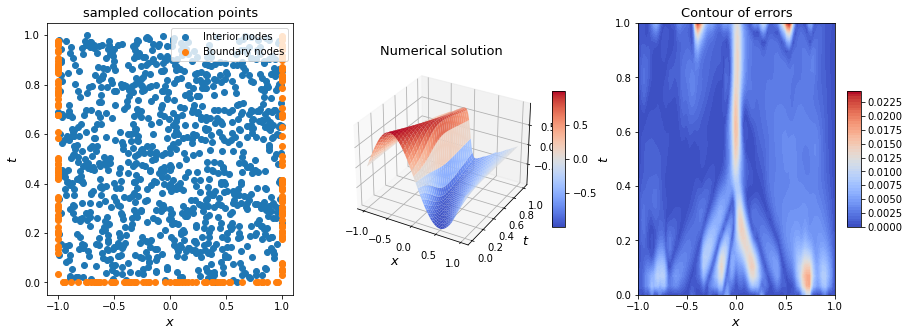

sigma = [ 3 20] , nugget = 1e-05 , # pts:  1201 
 space-time L2 error:  0.0040087824448355285 , max err:  0.024074289330561882


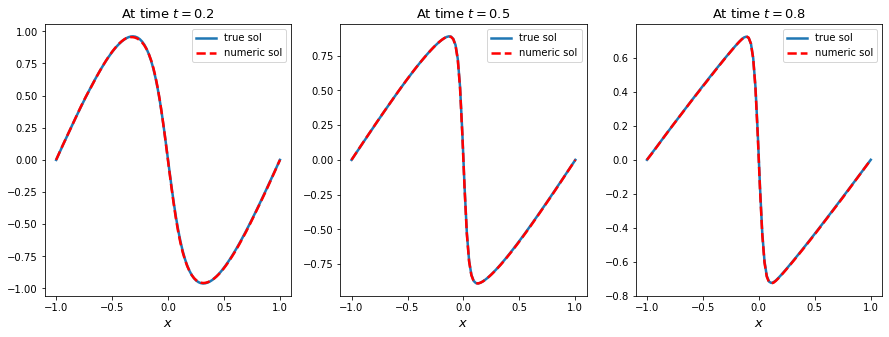

t=0.2, L2 error:  0.004801480892267066 , max err:  0.013451479646311215
t=0.5, L2 error:  0.002995350161981991 , max err:  0.013320106812474336
t=0.8, L2 error:  0.0031517074456226656 , max err:  0.01358028950510276


In [12]:
# plot figures
here_fontsize=13

# --------------space time plot---------------------
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(131)
ax.scatter(X_domain_tot[range(N_domain_tot), 1], X_domain_tot[range(N_domain_tot), 0], label='Interior nodes')
ax.scatter(X_boundary_tot[range(N_boundary_tot), 1], X_boundary_tot[range(N_boundary_tot), 0], label='Boundary nodes')
ax.legend(loc="upper right")
plt.title('sampled collocation points', fontsize=here_fontsize)
plt.xlabel('$x$', fontsize=here_fontsize)
plt.ylabel('$t$', fontsize=here_fontsize) 

# plot the numerical solution
ax = fig.add_subplot(132, projection='3d')
u_sol_surf=ax.plot_surface(YY, XX, extended_u, cmap=plt.cm.coolwarm)
plt.xlabel('$x$', fontsize=here_fontsize)
plt.ylabel('$t$', fontsize=here_fontsize) 
plt.title('Numerical solution', fontsize=here_fontsize)
fig.colorbar(u_sol_surf, shrink= 0.5, aspect = 10)

# contourf
ax = fig.add_subplot(133)
u_contourf=ax.contourf(YY, XX, abs(extended_u-u_truth), 50, cmap=plt.cm.coolwarm)
plt.xlabel('$x$', fontsize=here_fontsize)
plt.ylabel('$t$', fontsize=here_fontsize)
plt.title('Contour of errors', fontsize=here_fontsize)
fig.colorbar(u_contourf, shrink= 0.5, aspect = 10)

plt.show()
fig.tight_layout()

# fig.savefig('Burgers_pts1500_sol_contour_plt.pdf', bbox_inches='tight',dpi=100,pad_inches=0.1)

print('sigma =', set_sigma, ', nugget =', nugget, ', # pts: ', N_domain_tot+N_boundary_tot, '\n space-time L2 error: ', space_time_L2err, ', max err: ', space_time_Maxerr)

# ---------------time slice plot--------------------
fig = plt.figure(figsize=(15,5))

# plot the numerical solution
ax = fig.add_subplot(131)
ax.plot(yy, u_truth_t1, linewidth=2.5, label='true sol')
ax.plot(yy, extended_u_t1, linestyle='dashed', linewidth=2.5, color='red', label='numeric sol')
ax.set_xlabel('$x$', fontsize=here_fontsize)
ax.legend()
plt.title('At time $t = 0.2$', fontsize=here_fontsize)

ax = fig.add_subplot(132)
ax.plot(yy, u_truth_t2, linewidth=2.5, label='true sol')
ax.plot(yy, extended_u_t2, linestyle='dashed', linewidth=2.5, color='red', label='numeric sol')
ax.set_xlabel('$x$', fontsize=here_fontsize)
ax.legend()
plt.title('At time $t = 0.5$', fontsize=here_fontsize)

ax = fig.add_subplot(133)
ax.plot(yy, u_truth_t3, linewidth=2.5, label='true sol')
ax.plot(yy, extended_u_t3, linestyle='dashed', linewidth=2.5, color='red', label='numeric sol')
ax.set_xlabel('$x$', fontsize=here_fontsize)
ax.legend()
plt.title('At time $t = 0.8$',fontsize=here_fontsize)

plt.show()
fig.tight_layout()
# fig.savefig('Burgers_pts1500_time_sol_plt.pdf', bbox_inches='tight',dpi=100,pad_inches=0.1)

print('t=0.2, L2 error: ', L2err_t1 , ', max err: ', Maxerr_t1)
print('t=0.5, L2 error: ', L2err_t2 , ', max err: ', Maxerr_t2)
print('t=0.8, L2 error: ', L2err_t3 , ', max err: ', Maxerr_t3)

